# Training and deployment of a YOLO11 model for Pose Estimation

## 🌟 Overview

In this tutorial, you will learn how to work with the YOLO11 keypoint detection model from Ultralytics. We’ll guide you through downloading, training, and deploying the model on a Luxonis device, with clear code comments to help you follow along.

## 📜 Table of Contents
- [🛠️ Installation](#️installation)
- [🗃️ Data Preparation](#data-preparation)
- [🏋️‍♂️ Training](#️️training)
- [✍ Validation](#validation)
- [🧠 Infer](#infer)
- [💾 Weights Download](#weights)
- [🗂️ Conversion](#conversion)
- [📷 DepthAI Script](#depthai-script)

<a name="️installation"></a>

## 🛠️ Installation

We'll install all the dependencies we'll need.

In [ ]:
!pip install -q ultralytics depthai-nodes@git+https://github.com/luxonis/depthai-nodes.git@main -U
!pip install -q --extra-index-url https://artifacts.luxonis.com/artifactory/luxonis-python-release-local/ depthai==3.0.0a11

<a name ="data-preparation"></a>

## 🗃️ Data Preparation


If you use a custom dataset, you must prepare your dataset for training. Once you have set up a YAML file and sorted labels and images into the right directories, you can continue with the next step.

Luckily, we will be using `COCO8 Pose`, for which YAML already exists. You can check it out [here](https://github.com/ultralytics/ultralytics/blob/main/ultralytics/cfg/datasets/coco8-pose.yaml).

In case you need to train on a custom dataset, please follow these steps:

#### 1. Prepare your own dataset with images
#### 2. Generate label files in YOLO format

One image corresponds to one label file. Object information per row. Each row contains the following information about the object instance:

- Object class index: An integer representing the class of the object (e.g., 0 for person, 1 for car, etc.).
- Object center coordinates: The x and y coordinates of the center of the object, normalized to be between 0 and 1.
- Object width and height: The width and height of the object, normalized to be between 0 and 1.
- Object keypoint coordinates: The keypoints of the object, normalized to be between 0 and 1.

The label format example is below.

- Format with Dim = 2
```txt
<class-index> <x> <y> <width> <height> <px1> <py1> <px2> <py2> ... <pxn> <pyn>
```
- Format with Dim = 3
```txt
<class-index> <x> <y> <width> <height> <px1> <py1> <p1-visibility> <px2> <py2> <p2-visibility> <pxn> <pyn> <p2-visibility>
```

#### 3. Organize directories and create the `.yaml` file.

The config `.yaml` file should have the following structure:
```yaml
# Train/val/test sets as
# 1) dir: path/to/imgs
# 2) file: path/to/imgs.txt, or
# 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: ../dataset/
train: # train images (relative to 'path')
val: # val images (relative to 'path')
test: # test images (optional)

# Keypoints
kpt_shape: [17, 3] # number of keypoints, number of dims (2 for x,y or 3 for x,y,visible)
# flip_idx: ... # Optional, flip indices, for more details see https://docs.ultralytics.com/datasets/pose/#dataset-yaml-format

# Classes
names:
  0: [class-0]
  1: [class-1]
  ...

# Download script/URL (optional)
download:
```

For more details about the format, please refer to [this](https://docs.ultralytics.com/datasets/pose/) page.


<a name ="️️training"></a>

## 🏋️‍♂️ Training


Before we begin the training, we have to choose the pre-trained model. This image from `Ultralytics` documentation quickly summarizes them. You can find more about the models [here](https://docs.ultralytics.com/tasks/pose/#models).

<img src="./media/model_zoo.png" alt="YOLO11 Pose Estimation model variants selection" width="720">

We select the `YOLO11n` as it is the smallest and quickest. You can also experiment with heavier models, but it might affect the FPS on our devices.

In [2]:
from ultralytics import YOLO

# Load a pretrained model (recommended for training)
model = YOLO("yolo11n-pose.pt")

Before training, we can also launch the TensorBoard, which will allow us to inspect the training.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/pose/train

We will set image size *img* to *640*. We will train the model for *2* *epochs*. We set *data* to `coco8-pose.yaml`.

For the actual training, *epochs* should be higher (typically between *300-1000* epochs).

In [4]:
# Train the model
results = model.train(data="coco8-pose.yaml", epochs=2, imgsz=640)

Ultralytics 8.3.68 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=pose, mode=train, model=yolo11n-pose.pt, data=coco8-pose.yaml, epochs=2, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, l

train: Scanning /content/datasets/coco8-pose/labels/train.cache... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.2 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/datasets/coco8-pose/labels/val.cache... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]


Plotting labels to runs/pose/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 87 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/pose/train3
Starting training for 2 epochs...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


        1/2     0.705G      1.154      3.011      0.301     0.7083       1.34          9        640: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]

                   all          4         14      0.807      0.898      0.913      0.712          1      0.693      0.722      0.371



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


        2/2     0.675G      1.301       4.79     0.2194      1.075      1.521         11        640: 100%|██████████| 1/1 [00:00<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.57it/s]

                   all          4         14      0.816      0.857      0.907      0.705      0.985      0.643      0.716      0.351



2 epochs completed in 0.003 hours.
Optimizer stripped from runs/pose/train3/weights/last.pt, 6.1MB
Optimizer stripped from runs/pose/train3/weights/best.pt, 6.1MB

Validating runs/pose/train3/weights/best.pt...
Ultralytics 8.3.68 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n-pose summary (fused): 257 layers, 2,866,468 parameters, 0 gradients, 7.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.76it/s]


                   all          4         14      0.807      0.899      0.913      0.712          1      0.694      0.722      0.362
Speed: 0.6ms preprocess, 4.8ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/pose/train3


<a name ="validation"></a>

## ✍ Validation

After training our model, we can validate it on the validation set of our dataset.

In [5]:
metrics = model.val()

Ultralytics 8.3.68 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n-pose summary (fused): 257 layers, 2,866,468 parameters, 0 gradients, 7.4 GFLOPs


val: Scanning /content/datasets/coco8-pose/labels/val.cache... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]


                   all          4         14      0.807      0.896      0.912      0.712          1      0.694      0.722      0.361
Speed: 2.1ms preprocess, 53.6ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/pose/train32


<a name ="infer"></a>

## 🧠 Infer

Usually, we also want to visualize the prediction of the trained model on some image to ensure it does what it is supposed to do. This is called inference, and we'll perform it on one image.


Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /content/bus.jpg: 640x480 4 persons, 86.5ms
Speed: 5.5ms preprocess, 86.5ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 480)


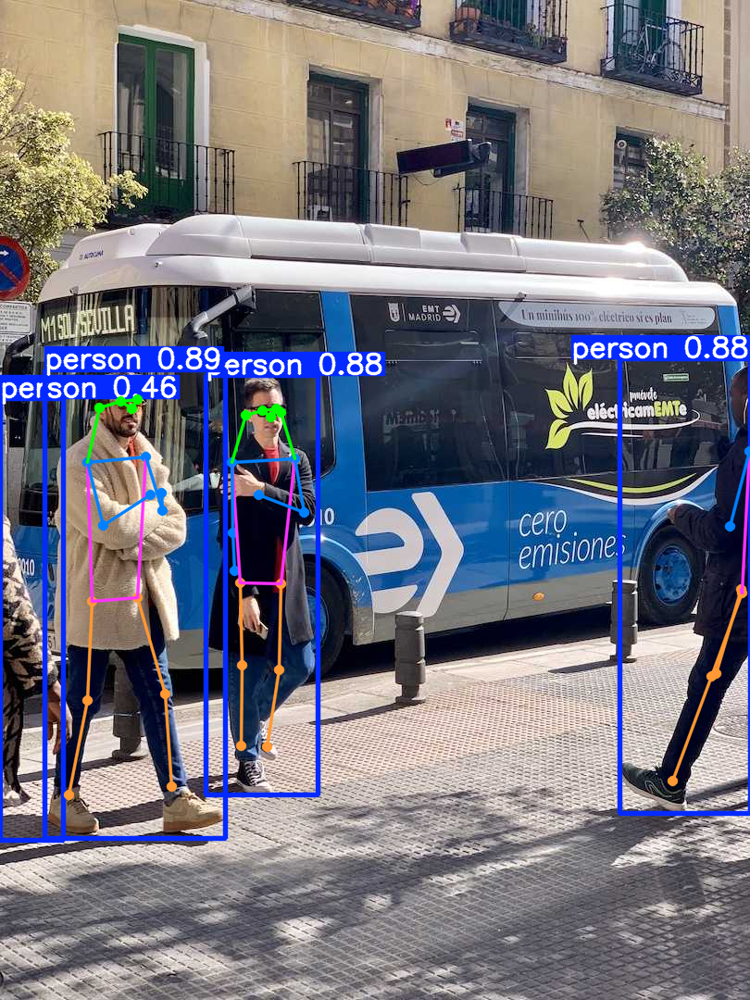

In [6]:
results = model("https://ultralytics.com/images/bus.jpg")  # Predict on an image
results[0].show() # Show the results

<a name="weights"></a>

## 💾 Weights Download

By default, the library saves the weights with the best performance into the `best.pt` file inside the corresponding run folder. We'll rename it to reflect the model better.

In [8]:
!cp runs/pose/train/weights/best.pt yolo11n_pose_trained.pt

If you are experiencing the following error:

```
NotImplementedError: A UTF-8 locale is required. Got ANSI_X3.4-1968
```

Please run the following command and rerun the previous command:

```python
import locale
locale.getpreferredencoding = lambda: "UTF-8"
```

We'll download the weights to convert them in the next step.

In [ ]:
from google.colab import files
files.download("yolo11n_pose_trained.pt")

<a name="conversion"></a>

## 🗂️ Conversion

We have the trained model, and the goal is to deploy it to the Luxonis device. The model's specific format depends on the Luxonis device series you have. To simplify the process, we recommend you use our [`HubAI`](https://hub.luxonis.com) platform. You can log in, navigate to the AI section, and click the `+ Add Model` button.

Please select `YOLO` as a model type.

<img src="./media/hub_model_type.png" alt="HubAI model type selection" width="640">

Then, choose your desired target platform (RVC2, RVC3, or RVC4). In our case, we will use RVC2.

<img src="./media/hubai_target_platform.png" alt="HubAI model platform selection" width="640">

Then, fill out the form on the image below with the information about your model.

<img src="./media/model_upload.png" alt="Exported model on HubAI" width="640">

After that, fill in specific information about the RVC2 export.

<img src="./media/model_rvc2.png" alt="Exported model on HubAI" width="640">

Choose the input image size. In our case, we will use `512x288`.

<img src="./media/yolo_rvc2_shape.png" alt="Exported model on HubAI" width="640">

Finally, click `Export` and wait for the model to be converted. The process might take some time, but after it's finished, we can download the model and use it with our DepthAI script. We'll use RVC2 in this tutorial, but you can follow the same process for other versions. All that is left to do is create a DepthAI script and deploy the model to the device. We already made such an example below. There are two variables that you need to populate, though:
- `ModelSlug`: This is a string representation of your model version based on which DepthAI can download it. You can get it by clicking the `Copy` button next to the `Convert` you used before.
- `ApiToken`: Since this model is private to your team, you need a token to access it. To generate the token, we navigate to team settings and click `+ Create API Token`. We then copy and paste it into the script below.

<img src="./media/model_card.png" alt="Exported model on HubAI" width="800">

In [ ]:
MODEL_SLUG = "insert_your_model_slug_here" # TODO: Insert your model slug
API_TOKEN = "insert_your_token_here" # TODO: Insert your API Token

To check out other possible ways to convert your model for our devices, please refer to our [documentation](https://rvc4.docs.luxonis.com/software/ai-inference/conversion/rvc-conversion/).

<a name="depthai-script"></a>

## 📷 DepthAI Script

Here is the script to run the model on the DepthAI device:

In [ ]:
import cv2
import depthai as dai
import numpy as np
from depthai_nodes import ParsingNeuralNetwork
from depthai_nodes.ml.messages import (
    ImgDetectionExtended,
    ImgDetectionsExtended
)
from typing import List
import os

os.environ["DEPTHAI_HUB_API_KEY"] = API_TOKEN

labels = ["person"]

def draw_extended_image_detections(
    frame: np.ndarray, detections: List[ImgDetectionExtended], labels=None
):
    """Draws (rotated) bounding boxes on the given frame."""

    for detection in detections:
        rect = detection.rotated_rect
        points = rect.getPoints()

        bbox = np.array([[point.x, point.y] for point in points])
        if np.any(bbox < 1):
            bbox[:, 0] = bbox[:, 0] * frame.shape[1]
            bbox[:, 1] = bbox[:, 1] * frame.shape[0]
        bbox = bbox.astype(int)
        cv2.polylines(frame, [bbox], isClosed=True, color=(255, 0, 0), thickness=2)

        try:
            keypoints = detection.keypoints
            for kp in keypoints:
                cv2.circle(
                    frame,
                    (int(kp.x * frame.shape[1]), int(kp.y * frame.shape[0])),
                    5,
                    (0, 0, 255),
                    -1,
                )
        except Exception:
            pass

        outer_points = rect.getOuterRect()
        xmin = int(outer_points[0] * frame.shape[1])
        ymin = int(outer_points[1] * frame.shape[0])
        cv2.putText(
            frame,
            f"{detection.confidence * 100:.2f}%",
            (xmin + 10, ymin + 20),
            cv2.FONT_HERSHEY_TRIPLEX,
            0.5,
            (255, 0, 0),
        )
        if labels is not None:
            cv2.putText(
                frame,
                labels[detection.label],
                (xmin + 10, ymin + 40),
                cv2.FONT_HERSHEY_TRIPLEX,
                0.5,
                (255, 0, 0),
            )

    return frame


def visualize_yolo_extended(
    frame: np.ndarray, message: ImgDetectionsExtended, extraParams: dict
):
    """Visualizes the YOLO pose detections on the frame."""

    detections = message.detections
    classes = extraParams.get("classes", None)

    if classes is None:
        raise ValueError("Classes are required for visualization.")

    frame = draw_extended_image_detections(frame, detections, classes)

    cv2.imshow("YOLO Pose Estimation", frame)
    if cv2.waitKey(1) == ord("q"):
        cv2.destroyAllWindows()
        return True

    return False


device = dai.Device()
platform = device.getPlatform()

nn_archive = dai.NNArchive(dai.getModelFromZoo(dai.NNModelDescription(MODEL_SLUG, platform.name)))

with dai.Pipeline(device) as pipeline:
    cam = pipeline.create(dai.node.Camera).build()
    nn_with_parser = pipeline.create(ParsingNeuralNetwork).build(
        cam.requestOutput((512, 288), type=dai.ImgFrame.Type.BGR888p), 
        nn_archive
    )
    parser_output_queue = nn_with_parser.out.createOutputQueue()
    frame_queue = nn_with_parser.passthrough.createOutputQueue()

    pipeline.start()

    while pipeline.isRunning():
        frame: np.ndarray = frame_queue.get().getCvFrame()
        nn_output: dai.ImgDetections = parser_output_queue.get()

        if visualize_yolo_extended(frame, nn_output, extraParams={"classes": labels}):
            pipeline.stop()
            break

Yay! 🎉🎉🎉 Huge congratulations, you have successfully finished this tutorial in which you trained and deployed a pre-trained YOLO11 nano pose estimation model to our cameras!